In [1]:
import obspy as op
import numpy as np
import cartopy.crs as ccrs
from obspy.clients.fdsn import Client
import cartopy.feature as cfeature

import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import datetime

###### Mindinao, Phillippines (6.7 Minimum - 6.9 Maximum)

In [2]:
currentDT = datetime.datetime.now()
print ('Download initiated. Should take about 8 seconds but requires an internet connection.')
print ('Download began: ',str(currentDT))

client = Client("IRIS")
t1 = op.UTCDateTime("1970-01-01T00:00:00") #start time of the request
t2 = op.UTCDateTime("2022-11-01T00:00:00") #end time of the request


minLat = 5.6386 
maxLat = 11.0015 
minLon = 118 
maxLon = 135
minMag = 6.7
maxMag = 6.9
catalog = client.get_events(starttime=t1, endtime=t2, minlatitude=minLat, maxlatitude=maxLat,
minlongitude=minLon, maxlongitude=maxLon, minmagnitude=minMag, maxmagnitude = maxMag)

currentDT = datetime.datetime.now()
print ('Download ended: ',str(currentDT))

Download initiated. Should take about 8 seconds but requires an internet connection.
Download began:  2022-11-30 15:30:46.820602
Download ended:  2022-11-30 15:30:47.711803


In [3]:
# print the number of EQ and print info of the most recent one (has index=0)
print(catalog)
print('Number of earthquakes', len(catalog.events))
print(catalog[0].origins[0].latitude,catalog[0].origins[0].longitude)
print(catalog[0].origins[0].time)
print(catalog[0].magnitudes[0].mag)

10 Event(s) in Catalog:
2019-12-15T06:11:51.155000Z |  +6.697, +125.174 | 6.8 mww
2012-02-06T03:49:13.920000Z |  +9.919, +123.217 | 6.7 MW
2006-06-18T17:20:43.750000Z |  +7.350, +127.248 | 6.8 MS
2003-05-26T23:13:31.100000Z |  +6.771, +123.807 | 6.8 MW
2001-01-01T08:54:32.650000Z |  +6.611, +127.078 | 6.8 MW
1997-03-11T19:22:00.370000Z |  +7.759, +127.674 | 6.9 mw
1991-11-13T11:12:15.550000Z |  +8.378, +126.409 | 6.8 mw
1990-02-08T07:15:28.370000Z |  +9.747, +124.703 | 6.7 mw
1987-05-12T01:30:27.500000Z |  +7.090, +126.710 | 6.7 mw
1985-03-18T19:49:43.190000Z |  +7.759, +123.517 | 6.7 mw
Number of earthquakes 10
6.6969 125.1739
2019-12-15T06:11:51.155000Z
6.8


In [4]:
#plt.hist(catalog.origins.time, bins = 50)
#catalog[0].origins[0].time
evlat =[]
evlon =[]
evdep =[]
evmag = []
index = 0
years = []
magnitudes = []

for eve in catalog:
    event = catalog[index]
    org = event.origins
    mags = event.magnitudes
    magnitudes.append(mags[0].mag)
    evlat.append(org[0].latitude)
    evlon.append(org[0].longitude)
    #print(org[0].depth)
    years.append(org[0].time.year)
    if (org[0].depth==None):
        evdep.append(0.0)
    else:
        evdep.append((org[0].depth) / 1000.0)
    evmag.append((event.magnitudes[0].mag)**4/2)
    index+=1
    
#years

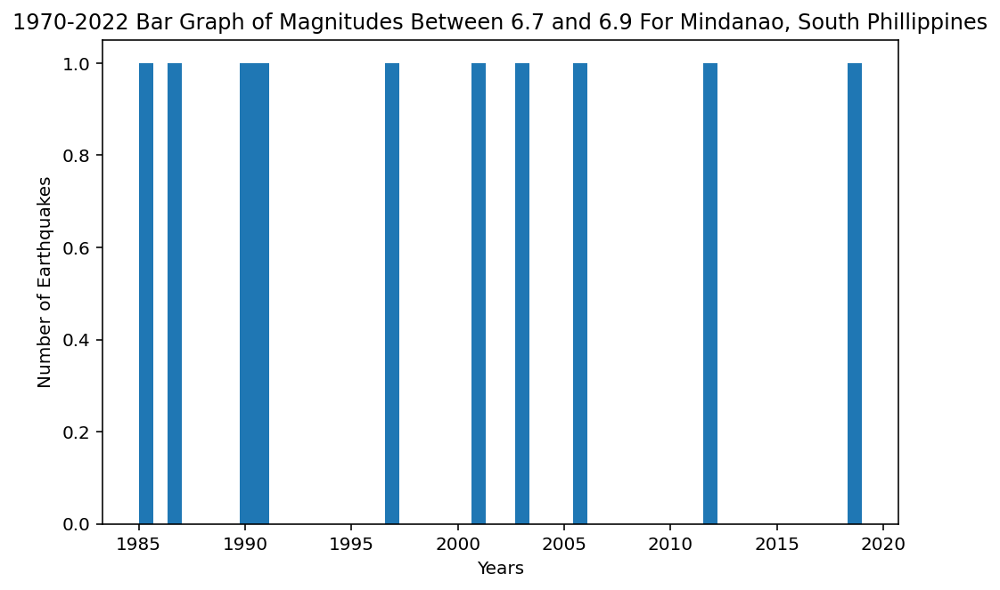

In [5]:
#histogram for minmag = 6.5 to max 6.9
plt.figure(figsize=(8,5))
plt.hist(years, bins=50)
plt.xlabel('Years')
plt.ylabel('Number of Earthquakes')
plt.title('1970-2022 Bar Graph of Magnitudes Between 6.7 and 6.9 For Mindanao, South Phillippines')
plt.show()

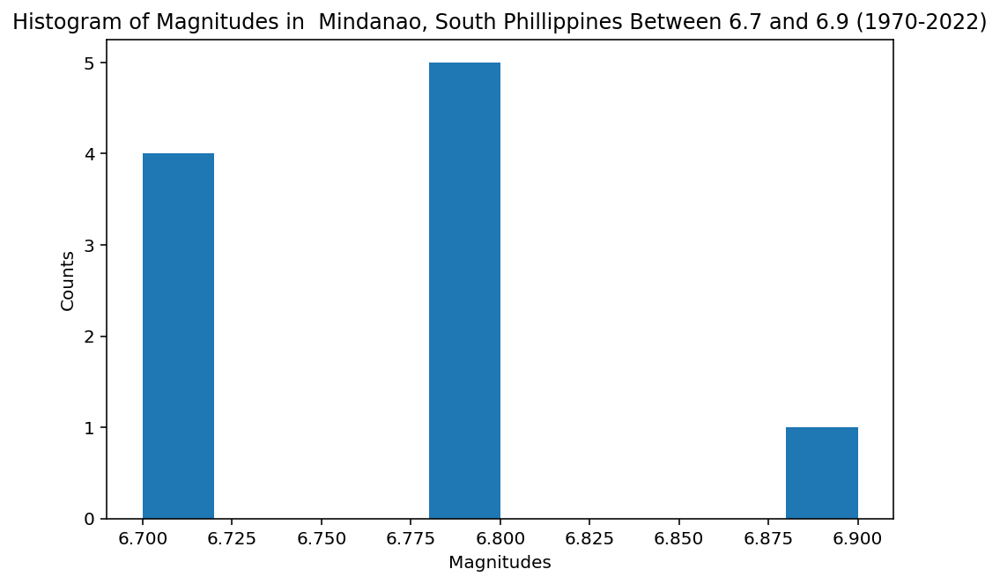

In [6]:
indices_mags_greater_6 = np.where(np.array(magnitudes) > 6)
mags_greater_6 = np.array(magnitudes)[indices_mags_greater_6]
plt.figure(figsize=(8,5))
plt.hist(magnitudes)
plt.xlabel('Magnitudes')
plt.ylabel('Counts')
plt.title('Histogram of Magnitudes in  Mindanao, South Phillippines Between 6.7 and 6.9 (1970-2022)')
plt.show()

In [7]:
#indices_mags_greater_6 = np.where(magnitudes > 6)
#b = np.array(magnitudes)
#b
#indices_mags_greater_6 = np.where(b > 6)
all_lats_mags_greater_6 = np.array([])
all_lons_mags_greater_6 = np.array([])
#mags_greater_6 = np.array(magnitudes)[indices_mags_greater_6]
lons_mags_greater_6 = np.array(evlon)[indices_mags_greater_6]
lats_mags_greater_6 = np.array(evlat)[indices_mags_greater_6]
#magnitudes
all_lats_mags_greater_6 = np.append(all_lats_mags_greater_6, 
                                    lats_mags_greater_6)
all_lons_mags_greater_6 = np.append(all_lons_mags_greater_6, 
                                    lons_mags_greater_6)



### Empirical relationship to calculate radius of earthquake influence
### is (in km) 10^(0.480 * M) where M is magnitude >= 3
len(lons_mags_greater_6)

10

C:\Users\17144\anaconda3\lib\site-packages\cartopy\crs.py:245: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
C:\Users\17144\anaconda3\lib\site-packages\cartopy\crs.py:297: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
C:\Users\17144\anaconda3\lib\site-packages\cartopy\crs.py:364: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:


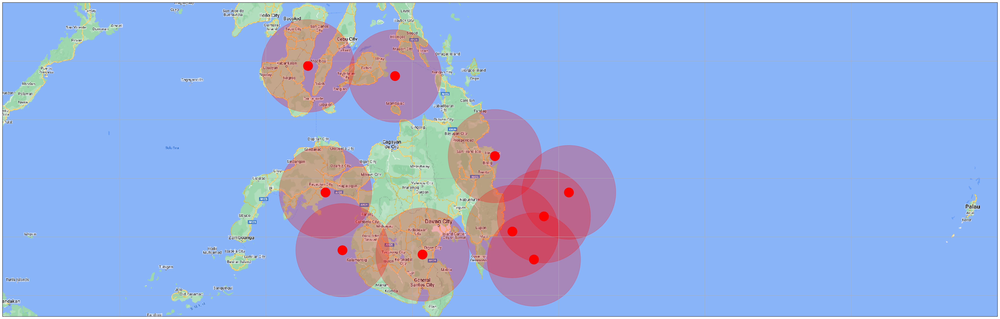

In [8]:
###Plotting Scatter on Map for 6.7-6.9
fig = plt.figure(figsize=(50,30))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
ax.set_extent([minLon,maxLon,minLat,maxLat], crs=ccrs.PlateCarree())
ax.gridlines()

import cartopy.io.img_tiles as cimgt
request = cimgt.GoogleTiles()
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_image(request, 8)
ax.scatter(evlon, evlat, c='b',s=400,transform=ccrs.PlateCarree())
ax.scatter(lons_mags_greater_6, lats_mags_greater_6, c = 'r', s = 700, 
           transform=ccrs.PlateCarree() )
ax.scatter(lons_mags_greater_6, lats_mags_greater_6, c = 'r', s = mags_greater_6 * 20.15 * 500, alpha = 0.25,
           transform=ccrs.PlateCarree() )


### Distance from Long Beach to Irvine = 30 miles = 48.2 km
## Rc = radius for concern = danger radius
### Northridge eq of magnitude 6.7 had 135 km radius for concern
### So, 135 / 6.7 = 20.15 km per magnitude.
### s = 20000 covers diameter of around 40 km. So 20000/40 = 500 markersize per km
###

In [9]:
mags_greater_6 * 20.15 * 500

array([ 68510. ,  67502.5,  68510. ,  68510. ,  68510. ,  69517.5,
        68510. ,  67502.5,  67502.5,  67502.5])

###### Mindinao, Phillipines (7.0 Minimum - 7.5 Maximum)

In [10]:
currentDT = datetime.datetime.now()
print ('Download initiated. Should take about 8 seconds but requires an internet connection.')
print ('Download began: ',str(currentDT))

client = Client("IRIS")
t1 = op.UTCDateTime("1970-01-01T00:00:00") #start time of the request
t2 = op.UTCDateTime("2022-11-01T00:00:00") #end time of the request



minLat = 5.6386 
maxLat = 11.0015 
minLon = 118 
maxLon = 135
minMag = 7.0
maxMag = 7.5
catalog = client.get_events(starttime=t1, endtime=t2, minlatitude=minLat, maxlatitude=maxLat,
minlongitude=minLon, maxlongitude=maxLon, minmagnitude=minMag, maxmagnitude = maxMag)

currentDT = datetime.datetime.now()
print ('Download ended: ',str(currentDT))

Download initiated. Should take about 8 seconds but requires an internet connection.
Download began:  2022-11-30 15:30:55.687607
Download ended:  2022-11-30 15:30:55.828653


In [11]:
# print the number of EQ and print info of the most recent one (has index=0)
print(catalog)
print('Number of earthquakes', len(catalog.events))
print(catalog[0].origins[0].latitude,catalog[0].origins[0].longitude)
print(catalog[0].origins[0].time)
print(catalog[0].magnitudes[0].mag)

11 Event(s) in Catalog:
2018-12-29T03:39:09.740000Z |  +5.898, +126.921 | 7.0 mww
2013-10-15T00:12:33.250000Z |  +9.833, +124.123 | 7.1 MW
...
1991-02-18T02:37:28.450000Z |  +8.909, +126.506 | 7.0 mw
1984-03-05T03:33:51.520000Z |  +8.167, +123.774 | 7.3 mw
To see all events call 'print(CatalogObject.__str__(print_all=True))'
Number of earthquakes 11
5.8983 126.9209
2018-12-29T03:39:09.740000Z
7.0


In [12]:
#plt.hist(catalog.origins.time, bins = 50)
#catalog[0].origins[0].time
evlat =[]
evlon =[]
evdep =[]
evmag = []
index = 0
years = []
magnitudes = []

for eve in catalog:
    event = catalog[index]
    org = event.origins
    mags = event.magnitudes
    magnitudes.append(mags[0].mag)
    evlat.append(org[0].latitude)
    evlon.append(org[0].longitude)
    #print(org[0].depth)
    years.append(org[0].time.year)
    if (org[0].depth==None):
        evdep.append(0.0)
    else:
        evdep.append((org[0].depth) / 1000.0)
    evmag.append((event.magnitudes[0].mag)**4/2)
    index+=1
    
#years

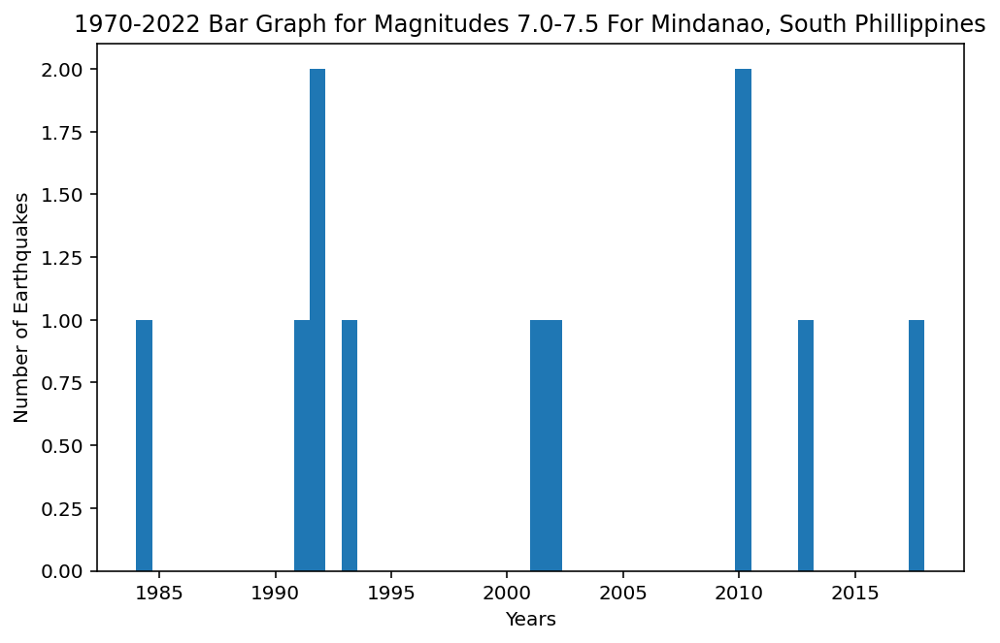

In [13]:
#histogram for magnitudes 7.0 - 7.5
plt.figure(figsize=(8,5))
plt.hist(years, bins=50)
plt.xlabel('Years')
plt.ylabel('Number of Earthquakes')
plt.title('1970-2022 Bar Graph for Magnitudes 7.0-7.5 For Mindanao, South Phillippines')
plt.show()

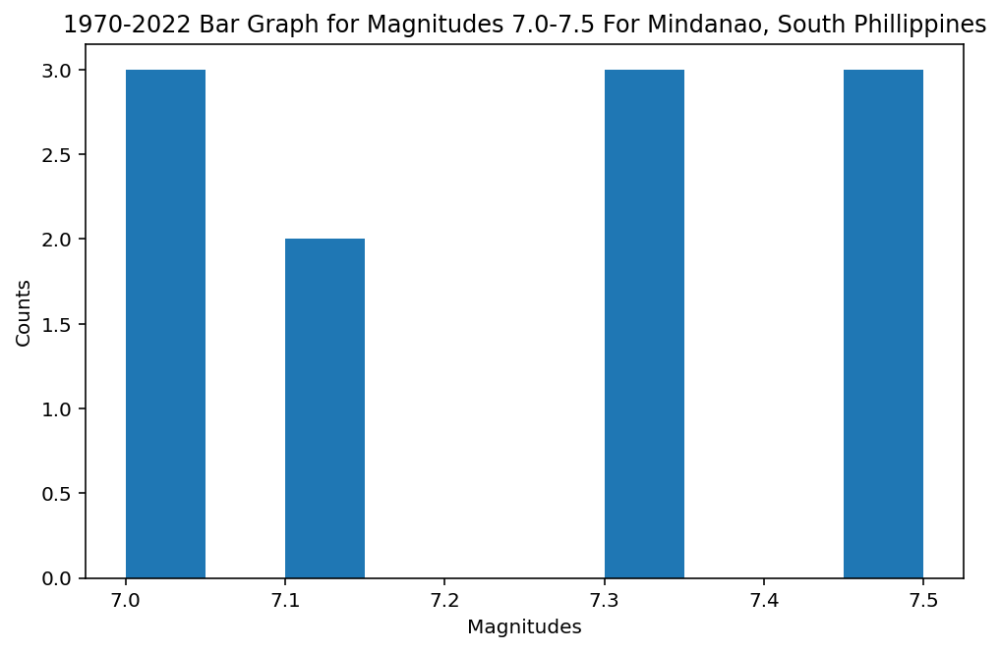

In [14]:
indices_mags_greater_6 = np.where(np.array(magnitudes) > 6.9)
mags_greater_6 = np.array(magnitudes)[indices_mags_greater_6]
plt.figure(figsize=(8,5))
plt.hist(magnitudes)
plt.xlabel('Magnitudes')
plt.ylabel('Counts')
plt.title('1970-2022 Bar Graph for Magnitudes 7.0-7.5 For Mindanao, South Phillippines')
plt.show()

In [15]:
#indices_mags_greater_6 = np.where(magnitudes > 6)
#b = np.array(magnitudes)
#b
#indices_mags_greater_6 = np.where(b > 6)
all_lats_mags_greater_6 = np.array([])
all_lons_mags_greater_6 = np.array([])
#mags_greater_6 = np.array(magnitudes)[indices_mags_greater_6]
lons_mags_greater_6 = np.array(evlon)[indices_mags_greater_6]
lats_mags_greater_6 = np.array(evlat)[indices_mags_greater_6]
#magnitudes
all_lats_mags_greater_6 = np.append(all_lats_mags_greater_6, 
                                    lats_mags_greater_6)
all_lons_mags_greater_6 = np.append(all_lons_mags_greater_6, 
                                    lons_mags_greater_6)



### Empirical relationship to calculate radius of earthquake influence
### is (in km) 10^(0.480 * M) where M is magnitude >= 3
len(lons_mags_greater_6)

11

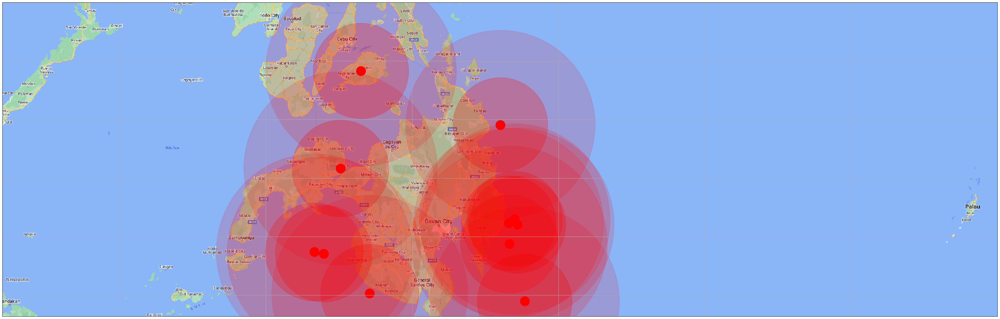

In [16]:
###Plotting Scatter on Map for 7.0-7.5)
fig = plt.figure(figsize=(50,30))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
ax.set_extent([minLon,maxLon,minLat,maxLat], crs=ccrs.PlateCarree())
ax.gridlines()

import cartopy.io.img_tiles as cimgt
request = cimgt.GoogleTiles()
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_image(request, 8)
ax.scatter(evlon, evlat, c='b',s=400,transform=ccrs.PlateCarree())
ax.scatter(lons_mags_greater_6, lats_mags_greater_6, c = 'r', s = 700, 
           transform=ccrs.PlateCarree() )
ax.scatter(lons_mags_greater_6, lats_mags_greater_6, c = 'r', s = mags_greater_6 * 20.15 * 500, alpha = 0.25,
           transform=ccrs.PlateCarree() )
ax.scatter(lons_mags_greater_6, lats_mags_greater_6, c = 'r', s = mags_greater_6 * 20.15 * 2000, alpha = 0.15,
           transform=ccrs.PlateCarree() )


In [17]:
minLat = 5.6386 
maxLat = 11.0015 
minLon = 118 
maxLon = 135

CAB = np.loadtxt('Boundary', usecols=(0,1)) 
#print(CAC.shape,CAB.shape)


plt.rcParams['figure.figsize'] = [15, 12]

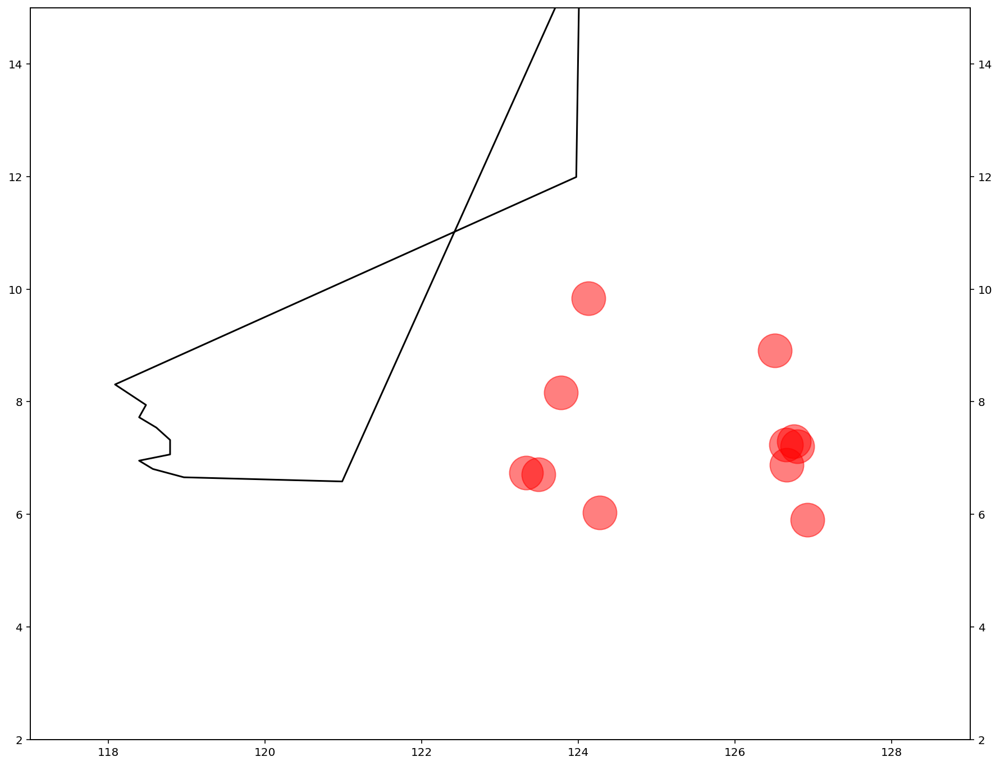

In [18]:
from matplotlib.animation import FFMpegWriter
metadata = dict(title='Movie Test', artist='Matplotlib',
                comment='Movie support!')
writer = FFMpegWriter(fps=15, metadata=metadata)

import matplotlib.animation as animation

fig = plt.figure()
ax = fig.add_subplot(111)
l, = ax.plot([], [], 'k-')
#ax = fig.add_subplot(111)
ax2 = ax.twinx()
m = ax2.plot([], [], 'o')[0]

#plt.xlim(-125, -113)
#plt.ylim(30, 43)

ax.set_ylim(2, 15)
ax.set_xlim(117, 129)

ax2.set_ylim(2, 15)
ax2.set_xlim(117, 129)

x0, y0 = 0, 0
x00 = []
y00 = []

x002 = []
y002 = []
n = CAB.shape[0]
CAB_2x = CAB[0:n,0]   ###Longitude, on the x-axis
CAB_2y = CAB[0:n,1]   ### LAtitude, on the y-axis


with writer.saving(fig, "project_vid.mp4", 100):
    nff = len(all_lons_mags_greater_6)
    nf = n #len(CAB)
    for i in range(nf):
        #x0 += 0.1 #* np.random.randn()
        #y0 += 0.1 #* np.random.randn()
        x0 = CAB_2x[i]
        y0 = CAB_2y[i]
        x00 = np.append(x00, x0)
        y00 = np.append(y00, y0)
        #l.set_data(x00, y00)
        #plt.pause(0.05)
        if(i % 10 == 0):
            l.set_data(x00, y00)
            writer.grab_frame()
        if(i < 20): ### Gets 1st 10 frames
            l.set_data(x00, y00)
            writer.grab_frame()
        if(i <= nf-1 and i >= nf - 5): ###Gets last 8
            l.set_data(x00, y00)
            writer.grab_frame()
    for i in range(5):
        writer.grab_frame() 
    m.set_markersize(30) 
    m.set_alpha(0.5)
    m.set_color('r')
    m.set_marker('o')
    for j in range(nff):
        x0 = all_lons_mags_greater_6[j]
        y0 = all_lats_mags_greater_6[j]
        x002 = np.append(x002, x0)
        y002 = np.append(y002, y0)
        m.set_data(x002, y002)
        for i in range(10):
            writer.grab_frame()

### Mindinao, Phillipines (7.3 Minimum - 7.5 Maximum)

In [19]:
currentDT = datetime.datetime.now()
print ('Download initiated. Should take about 8 seconds but requires an internet connection.')
print ('Download began: ',str(currentDT))

client = Client("IRIS")
t1 = op.UTCDateTime("1970-01-01T00:00:00") #start time of the request
t2 = op.UTCDateTime("2022-11-01T00:00:00") #end time of the request



minLat = 5.6386 
maxLat = 11.0015 
minLon = 118 
maxLon = 135
minMag = 7.3
maxMag = 7.5
catalog = client.get_events(starttime=t1, endtime=t2, minlatitude=minLat, maxlatitude=maxLat,
minlongitude=minLon, maxlongitude=maxLon, minmagnitude=minMag, maxmagnitude = maxMag)

currentDT = datetime.datetime.now()
print ('Download ended: ',str(currentDT))

Download initiated. Should take about 8 seconds but requires an internet connection.
Download began:  2022-11-30 15:31:08.389476
Download ended:  2022-11-30 15:31:08.526508


In [20]:
# print the number of EQ and print info of the most recent one (has index=0)
print(catalog)
print('Number of earthquakes', len(catalog.events))
print(catalog[0].origins[0].latitude,catalog[0].origins[0].longitude)
print(catalog[0].origins[0].time)
print(catalog[0].magnitudes[0].mag)

6 Event(s) in Catalog:
2010-07-23T23:15:09.820000Z |  +6.740, +123.327 | 7.5 MW
2010-07-23T22:08:11.220000Z |  +6.711, +123.488 | 7.3 MW
2002-03-05T21:16:09.660000Z |  +6.032, +124.273 | 7.5 MW
2001-01-01T06:57:04.040000Z |  +6.876, +126.659 | 7.5 MW
1992-05-17T10:15:33.080000Z |  +7.207, +126.796 | 7.3 mw
1984-03-05T03:33:51.520000Z |  +8.167, +123.774 | 7.3 mw
Number of earthquakes 6
6.7403 123.327
2010-07-23T23:15:09.820000Z
7.5


In [21]:
#plt.hist(catalog.origins.time, bins = 50)
#catalog[0].origins[0].time
evlat =[]
evlon =[]
evdep =[]
evmag = []
index = 0
years = []
magnitudes = []

for eve in catalog:
    event = catalog[index]
    org = event.origins
    mags = event.magnitudes
    magnitudes.append(mags[0].mag)
    evlat.append(org[0].latitude)
    evlon.append(org[0].longitude)
    #print(org[0].depth)
    years.append(org[0].time.year)
    if (org[0].depth==None):
        evdep.append(0.0)
    else:
        evdep.append((org[0].depth) / 1000.0)
    evmag.append((event.magnitudes[0].mag)**4/2)
    index+=1
    
#years

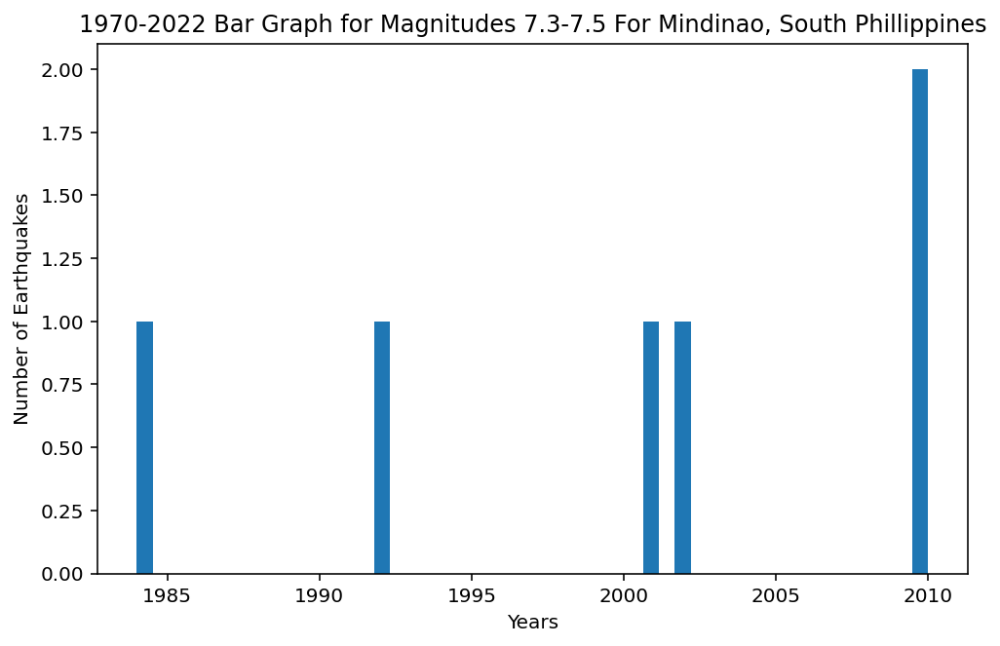

In [22]:
#histogram for magnitudes 7.0 - 7.5
plt.figure(figsize=(8,5))
plt.hist(years, bins=50)
plt.xlabel('Years')
plt.ylabel('Number of Earthquakes')
plt.title('1970-2022 Bar Graph for Magnitudes 7.3-7.5 For Mindinao, South Phillippines')
plt.show()

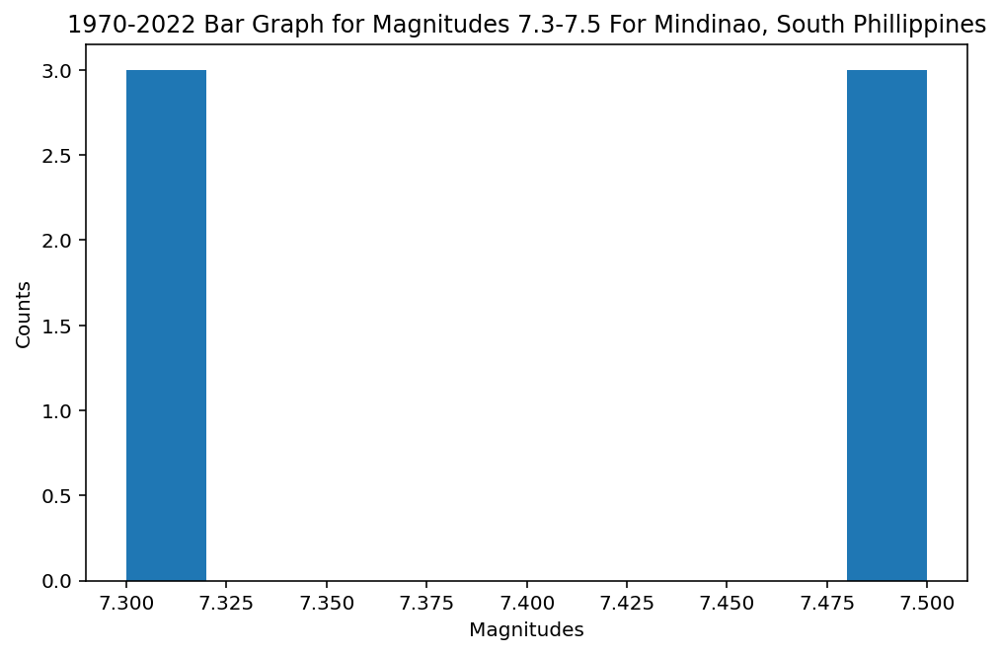

In [23]:
indices_mags_greater_6 = np.where(np.array(magnitudes) > 7.2)
mags_greater_6 = np.array(magnitudes)[indices_mags_greater_6]
plt.figure(figsize=(8,5))
plt.hist(magnitudes)
plt.xlabel('Magnitudes')
plt.ylabel('Counts')
plt.title('1970-2022 Bar Graph for Magnitudes 7.3-7.5 For Mindinao, South Phillippines')
plt.show()

In [24]:
#indices_mags_greater_6 = np.where(magnitudes > 6)
#b = np.array(magnitudes)
#b
#indices_mags_greater_6 = np.where(b > 6)
all_lats_mags_greater_6 = np.array([])
all_lons_mags_greater_6 = np.array([])
#mags_greater_6 = np.array(magnitudes)[indices_mags_greater_6]
lons_mags_greater_6 = np.array(evlon)[indices_mags_greater_6]
lats_mags_greater_6 = np.array(evlat)[indices_mags_greater_6]
#magnitudes
all_lats_mags_greater_6 = np.append(all_lats_mags_greater_6, 
                                    lats_mags_greater_6)
all_lons_mags_greater_6 = np.append(all_lons_mags_greater_6, 
                                    lons_mags_greater_6)



### Empirical relationship to calculate radius of earthquake influence
### is (in km) 10^(0.480 * M) where M is magnitude >= 3
len(lons_mags_greater_6)

6

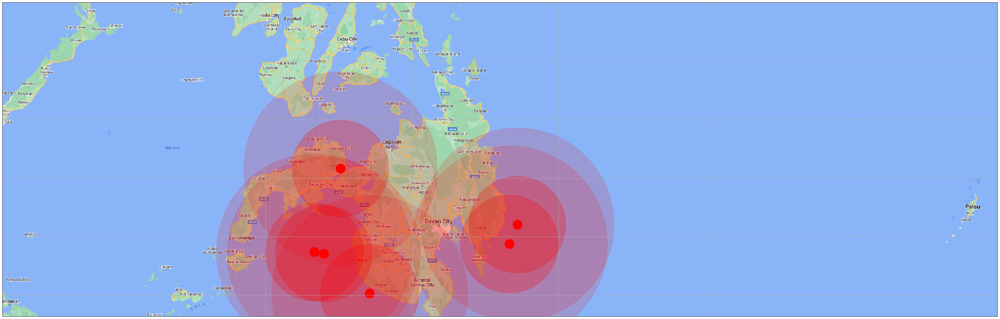

In [25]:
###Plotting Scatter on Map for 7.0-7.5)
fig = plt.figure(figsize=(50,30))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
ax.set_extent([minLon,maxLon,minLat,maxLat], crs=ccrs.PlateCarree())
ax.gridlines()

import cartopy.io.img_tiles as cimgt
request = cimgt.GoogleTiles()
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_image(request, 8)
ax.scatter(evlon, evlat, c='b',s=400,transform=ccrs.PlateCarree())
ax.scatter(lons_mags_greater_6, lats_mags_greater_6, c = 'r', s = 700, 
           transform=ccrs.PlateCarree() )
ax.scatter(lons_mags_greater_6, lats_mags_greater_6, c = 'r', s = mags_greater_6 * 20.15 * 500, alpha = 0.25,
           transform=ccrs.PlateCarree() )
ax.scatter(lons_mags_greater_6, lats_mags_greater_6, c = 'r', s = mags_greater_6 * 20.15 * 2000, alpha = 0.15,
           transform=ccrs.PlateCarree() )

In [26]:
#7.5 and up Only

In [27]:
currentDT = datetime.datetime.now()
print ('Download initiated. Should take about 8 seconds but requires an internet connection.')
print ('Download began: ',str(currentDT))

client = Client("IRIS")
t1 = op.UTCDateTime("1970-01-01T00:00:00") #start time of the request
t2 = op.UTCDateTime("2022-11-01T00:00:00") #end time of the request



minLat = 5.6386 
maxLat = 11.0015 
minLon = 118 
maxLon = 135
minMag = 7.5
maxMag = 7.9
catalog = client.get_events(starttime=t1, endtime=t2, minlatitude=minLat, maxlatitude=maxLat,
minlongitude=minLon, maxlongitude=maxLon, minmagnitude=minMag, maxmagnitude = maxMag)

currentDT = datetime.datetime.now()
print ('Download ended: ',str(currentDT))

Download initiated. Should take about 8 seconds but requires an internet connection.
Download began:  2022-11-30 15:31:18.039663
Download ended:  2022-11-30 15:31:18.143683


In [28]:
# print the number of EQ and print info of the most recent one (has index=0)
print(catalog)
print('Number of earthquakes', len(catalog.events))
print(catalog[0].origins[0].latitude,catalog[0].origins[0].longitude)
print(catalog[0].origins[0].time)
print(catalog[0].magnitudes[0].mag)

7 Event(s) in Catalog:
2012-08-31T12:47:35.540000Z | +10.811, +126.826 | 7.6 MW
2010-07-23T23:15:09.820000Z |  +6.740, +123.327 | 7.5 MW
2010-07-23T22:51:13.000000Z |  +6.423, +123.580 | 7.7 MW
2006-02-26T22:31:33.370000Z |  +8.472, +123.086 | 7.8 MS
2006-02-15T18:29:15.460000Z |  +9.624, +121.950 | 7.9 mb
2002-03-05T21:16:09.660000Z |  +6.032, +124.273 | 7.5 MW
2001-01-01T06:57:04.040000Z |  +6.876, +126.659 | 7.5 MW
Number of earthquakes 7
10.8107 126.8262
2012-08-31T12:47:35.540000Z
7.6


In [29]:
#plt.hist(catalog.origins.time, bins = 50)
#catalog[0].origins[0].time
evlat =[]
evlon =[]
evdep =[]
evmag = []
index = 0
years = []
magnitudes = []

for eve in catalog:
    event = catalog[index]
    org = event.origins
    mags = event.magnitudes
    magnitudes.append(mags[0].mag)
    evlat.append(org[0].latitude)
    evlon.append(org[0].longitude)
    #print(org[0].depth)
    years.append(org[0].time.year)
    if (org[0].depth==None):
        evdep.append(0.0)
    else:
        evdep.append((org[0].depth) / 1000.0)
    evmag.append((event.magnitudes[0].mag)**4/2)
    index+=1
    
#years

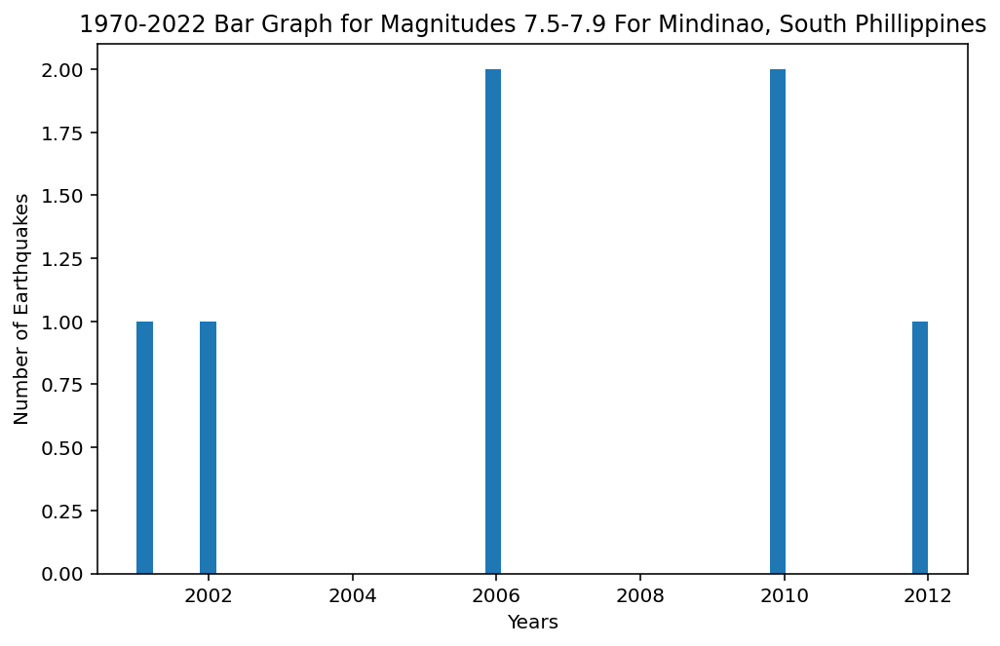

In [30]:
plt.figure(figsize=(8,5))
plt.hist(years, bins=50)
plt.xlabel('Years')
plt.ylabel('Number of Earthquakes')
plt.title('1970-2022 Bar Graph for Magnitudes 7.5-7.9 For Mindinao, South Phillippines')
plt.show()

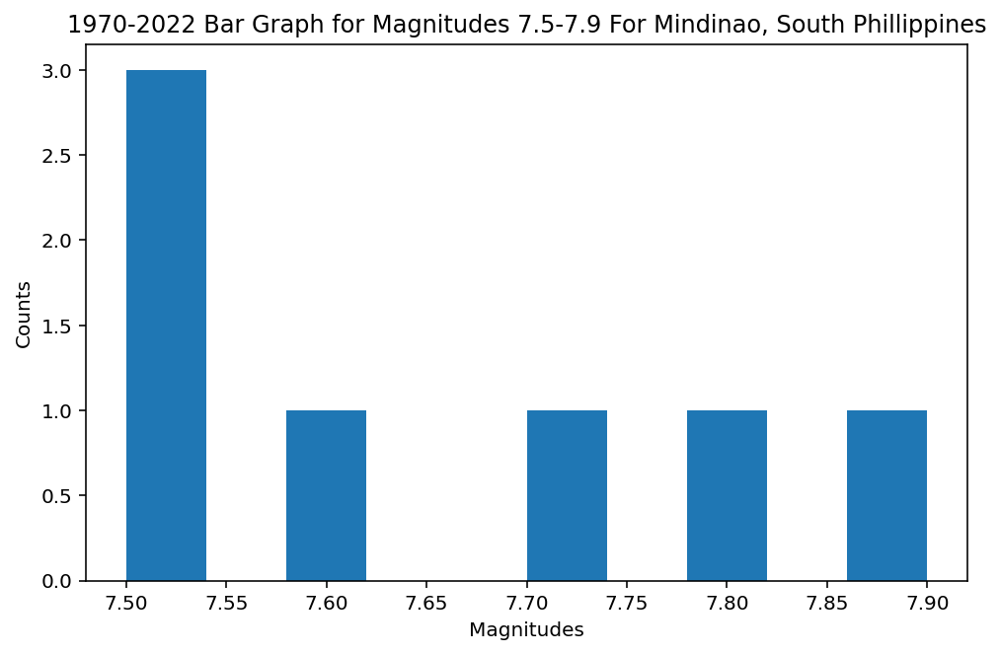

In [31]:
indices_mags_greater_6 = np.where(np.array(magnitudes) > 7.2)
mags_greater_6 = np.array(magnitudes)[indices_mags_greater_6]
plt.figure(figsize=(8,5))
plt.hist(magnitudes)
plt.xlabel('Magnitudes')
plt.ylabel('Counts')
plt.title('1970-2022 Bar Graph for Magnitudes 7.5-7.9 For Mindinao, South Phillippines')
plt.show()

In [32]:
#indices_mags_greater_6 = np.where(magnitudes > 6)
#b = np.array(magnitudes)
#b
#indices_mags_greater_6 = np.where(b > 6)
all_lats_mags_greater_6 = np.array([])
all_lons_mags_greater_6 = np.array([])
#mags_greater_6 = np.array(magnitudes)[indices_mags_greater_6]
lons_mags_greater_6 = np.array(evlon)[indices_mags_greater_6]
lats_mags_greater_6 = np.array(evlat)[indices_mags_greater_6]
#magnitudes
all_lats_mags_greater_6 = np.append(all_lats_mags_greater_6, 
                                    lats_mags_greater_6)
all_lons_mags_greater_6 = np.append(all_lons_mags_greater_6, 
                                    lons_mags_greater_6)



### Empirical relationship to calculate radius of earthquake influence
### is (in km) 10^(0.480 * M) where M is magnitude >= 3
len(lons_mags_greater_6)

7

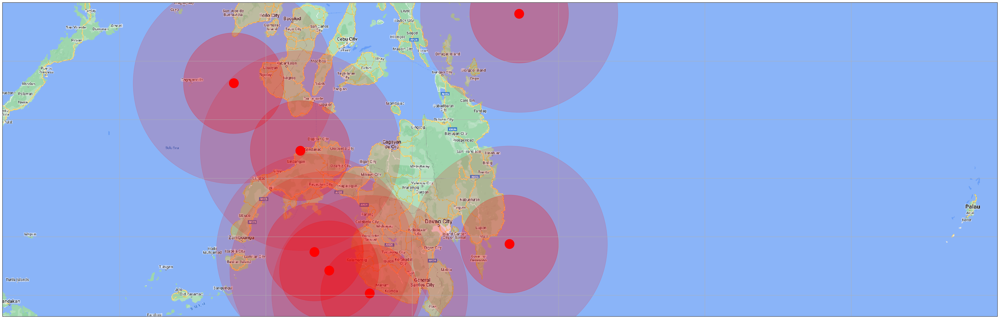

In [33]:
###Plotting Scatter on Map for 7.5 and up)
fig = plt.figure(figsize=(50,30))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
ax.set_extent([minLon,maxLon,minLat,maxLat], crs=ccrs.PlateCarree())
ax.gridlines()

import cartopy.io.img_tiles as cimgt
request = cimgt.GoogleTiles()
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_image(request, 8)
ax.scatter(evlon, evlat, c='b',s=400,transform=ccrs.PlateCarree())
ax.scatter(lons_mags_greater_6, lats_mags_greater_6, c = 'r', s = 700, 
           transform=ccrs.PlateCarree() )
ax.scatter(lons_mags_greater_6, lats_mags_greater_6, c = 'r', s = mags_greater_6 * 20.15 * 500, alpha = 0.25,
           transform=ccrs.PlateCarree() )
ax.scatter(lons_mags_greater_6, lats_mags_greater_6, c = 'r', s = mags_greater_6 * 20.15 * 2000, alpha = 0.15,
           transform=ccrs.PlateCarree() )

In [34]:
currentDT = datetime.datetime.now()
print ('Download initiated. Should take about 8 seconds but requires an internet connection.')
print ('Download began: ',str(currentDT))

client = Client("IRIS")
t1 = op.UTCDateTime("1970-01-01T00:00:00") #start time of the request
t2 = op.UTCDateTime("2010-11-01T00:00:00") #end time of the request



minLat = 5.6386 
maxLat = 11.0015 
minLon = 118 
maxLon = 135
minMag = 7.8
catalog = client.get_events(starttime=t1, endtime=t2, minlatitude=minLat, maxlatitude=maxLat,
minlongitude=minLon, maxlongitude=maxLon, minmagnitude=minMag)

currentDT = datetime.datetime.now()
print ('Download ended: ',str(currentDT))

Download initiated. Should take about 8 seconds but requires an internet connection.
Download began:  2022-11-30 15:31:26.751628
Download ended:  2022-11-30 15:31:26.866652


In [35]:
#indices_mags_greater_6 = np.where(magnitudes > 6)
#b = np.array(magnitudes)
#b
#indices_mags_greater_6 = np.where(b > 6)
all_lats_mags_greater_6 = np.array([])
all_lons_mags_greater_6 = np.array([])
#mags_greater_6 = np.array(magnitudes)[indices_mags_greater_6]
lons_mags_greater_6 = np.array(evlon)[indices_mags_greater_6]
lats_mags_greater_6 = np.array(evlat)[indices_mags_greater_6]
#magnitudes
all_lats_mags_greater_6 = np.append(all_lats_mags_greater_6, 
                                    lats_mags_greater_6)
all_lons_mags_greater_6 = np.append(all_lons_mags_greater_6, 
                                    lons_mags_greater_6)



### Empirical relationship to calculate radius of earthquake influence
### is (in km) 10^(0.480 * M) where M is magnitude >= 3
len(lons_mags_greater_6)

7

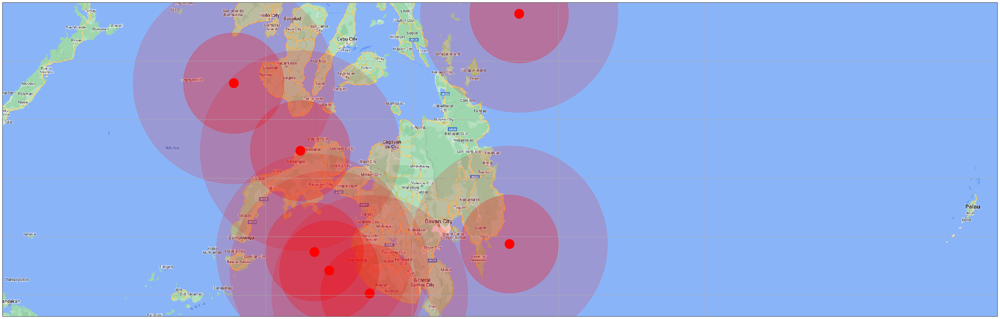

In [36]:
###Plotting Scatter on Map for 7.8 and up)
fig = plt.figure(figsize=(50,30))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
ax.set_extent([minLon,maxLon,minLat,maxLat], crs=ccrs.PlateCarree())
ax.gridlines()

import cartopy.io.img_tiles as cimgt
request = cimgt.GoogleTiles()
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_image(request, 8)
ax.scatter(evlon, evlat, c='b',s=400,transform=ccrs.PlateCarree())
ax.scatter(lons_mags_greater_6, lats_mags_greater_6, c = 'r', s = 700, 
           transform=ccrs.PlateCarree() )
ax.scatter(lons_mags_greater_6, lats_mags_greater_6, c = 'r', s = mags_greater_6 * 20.15 * 500, alpha = 0.25,
           transform=ccrs.PlateCarree() )
ax.scatter(lons_mags_greater_6, lats_mags_greater_6, c = 'r', s = mags_greater_6 * 20.15 * 2000, alpha = 0.15,
           transform=ccrs.PlateCarree() )